# Homework 5: An External Forcing Experiment

Name: Megan Sharkey

Date: September 19th 2025

#### Overview
In class, we set up the MITgcm `global_ocean_ebm` configuration with the `exf` package to run on MITgcm. In this assignment, we will assess the output of this model configuration. 

To begin, import the Python modules for manging and plotting data, and making movies. Then, define a path to your homework 5 directory. Finally, the `diags` folder on Spartan to your local machine.

In [11]:
# import pertinent modules
import os
import numpy as np
import matplotlib.pyplot as plt
import cmocean.cm as cm
import moviepy.video.io.ImageSequenceClip

# define a path to the diags directory
diags_dir = '/Users/msharkey/Documents/MLML/FALL 2025/MS 274/homework/week 5 hw/diags'
homework_folder = '/Users/msharkey/Documents/MLML/FALL 2025/MS 274/homework/week 5 hw'

### Part 1: Choose Variables to Examine 
In this assignment, you'll investigate the relationship between a state variable (temperature, salinity, or velocity) and an associated forcing variable (heat flux, freshwater flux, or wind stress). 

In the markdown cell below, indicate which pair of variables you're going to investigate.

*Edit this markdown cell and identify which variables you'll investigate.*

I will investiagte **salinity** and **freshwater flux**.

### Part 2: Make a Movie
Next, make a movie for your variables of interest. The movie should show your state variable in one panel and your forcing variable in another panel. If you are using velocity and wind stress, you can either plot the magnitude of these variables or plot the vector components individually.

In [12]:
# edit these code cells
# freshwater flux is EXFempmr in the diagsEXF directory
# Salinity is SALT in the diagSurf directory 

salinity_file = os.path.join(diags_dir, 'diagSurf', 'diagSurf.0000003645.data')
freshwater_flux_file = os.path.join(diags_dir, 'diagsEXF', 'diagsEXF.0000003645.data')

salinity_grid = np.fromfile(salinity_file, '>f4').reshape((2, 40, 90))[1]
freshwater_flux_grid = np.fromfile(freshwater_flux_file, '>f4').reshape((4, 40, 90))[3]


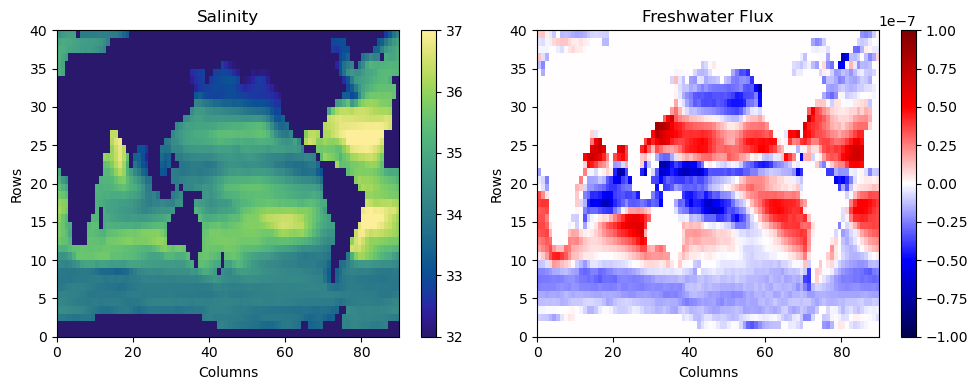

In [13]:
# make a figure object
fig = plt.figure(figsize = (10,4))

# salinity
plt.subplot(1,2,1)
plt.pcolormesh(salinity_grid, cmap='cmo.haline', vmin = 32, vmax = 37)
plt.colorbar()
plt.xlabel('Columns')
plt.ylabel('Rows')
plt.title('Salinity')

# freshwater flux
plt.subplot(1,2,2)
plt.pcolormesh(freshwater_flux_grid, cmap='seismic', vmin = -1e-7, vmax = 1e-7)
plt.colorbar()
plt.xlabel('Columns')
plt.ylabel('Rows')
plt.title('Freshwater Flux')

plt.tight_layout()   
plt.show()

In [14]:
def plot_frame(data_path, image_path):

    # make a figure object
    fig = plt.figure(figsize = (10,4))

    salinity_grid = np.fromfile(data_path, '>f4').reshape((2, 40, 90))[1]

    iteration = os.path.basename(data_path).split('.')[-2]

    freshwater_flux_file = os.path.join(diags_dir, 'diagsEXF', f'diagsEXF.{iteration}.data')
    freshwater_flux_grid = np.fromfile(freshwater_flux_file, '>f4').reshape((4, 40, 90))[3]

    # salinity
    plt.subplot(1,2,1)
    plt.pcolormesh(salinity_grid, cmap='cmo.haline', vmin = 32, vmax = 37)
    plt.colorbar()
    plt.xlabel('Columns'); plt.ylabel('Rows'); plt.title('Salinity')

    # freshwater flux
    plt.subplot(1,2,2)
    plt.pcolormesh(freshwater_flux_grid, cmap='seismic', vmin = -1e-7, vmax = 1e-7)
    plt.colorbar()
    plt.xlabel('Columns'); plt.ylabel('Rows'); plt.title('Freshwater Flux')

    # save and close
    plt.tight_layout()
    plt.savefig(image_path)


/var/folders/p_/r3l2k0v15s16v1d1593p15400000gs/T/ipykernel_94139/1625999952.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize = (10,4))


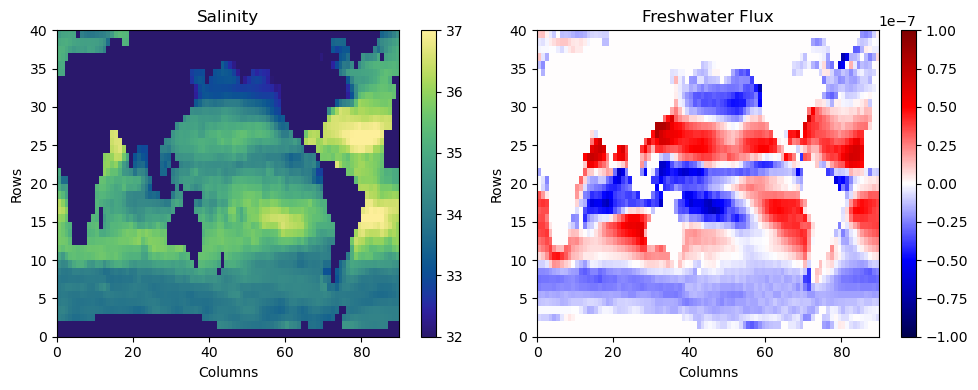

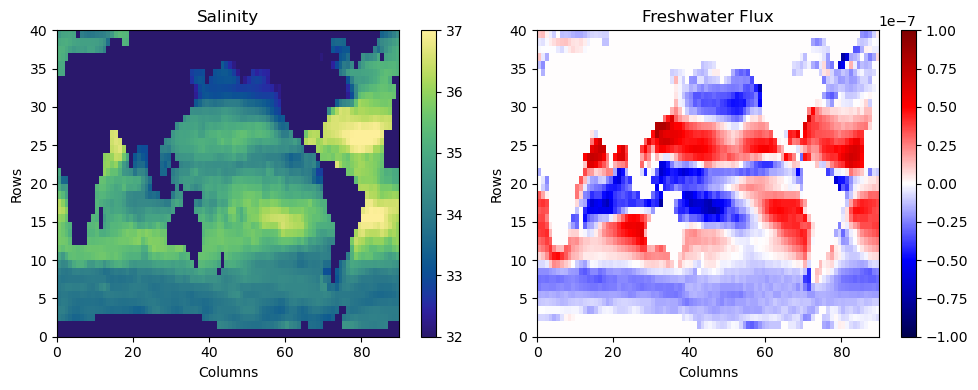

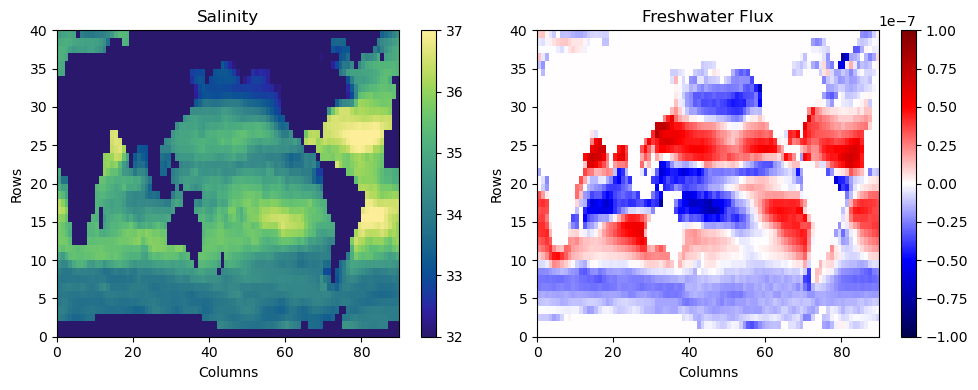

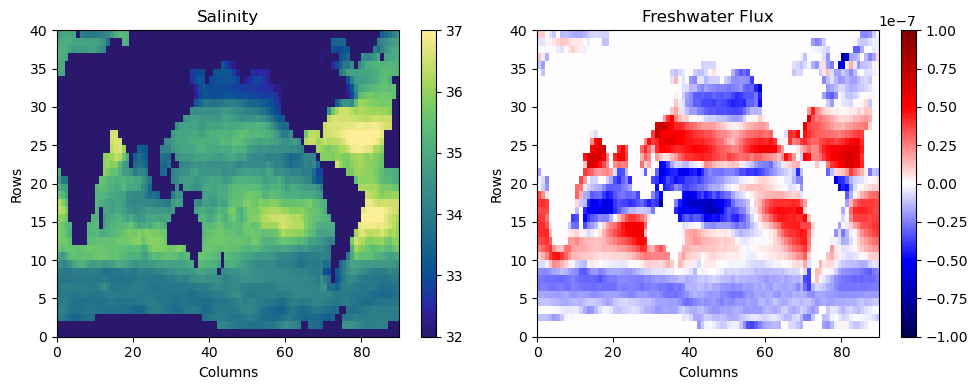

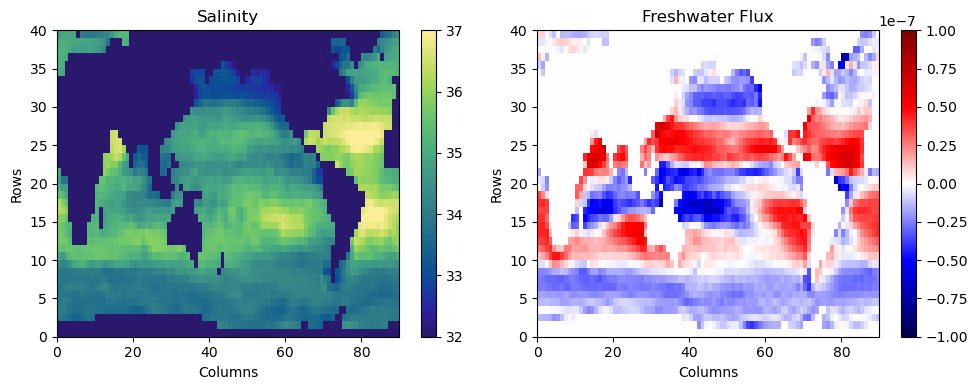

...

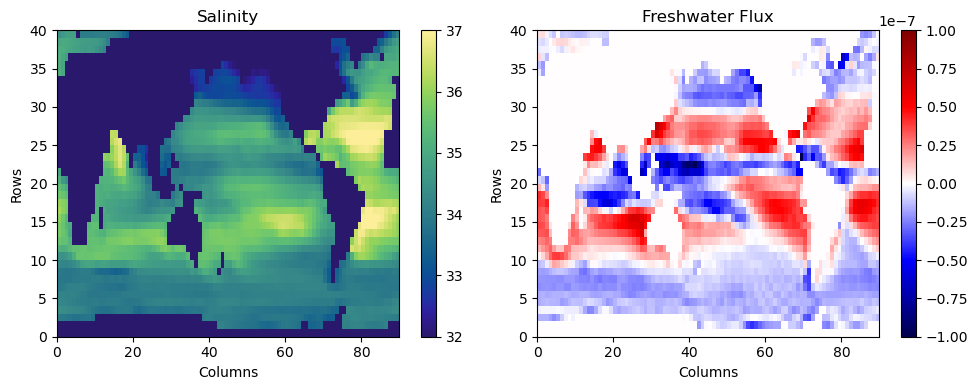

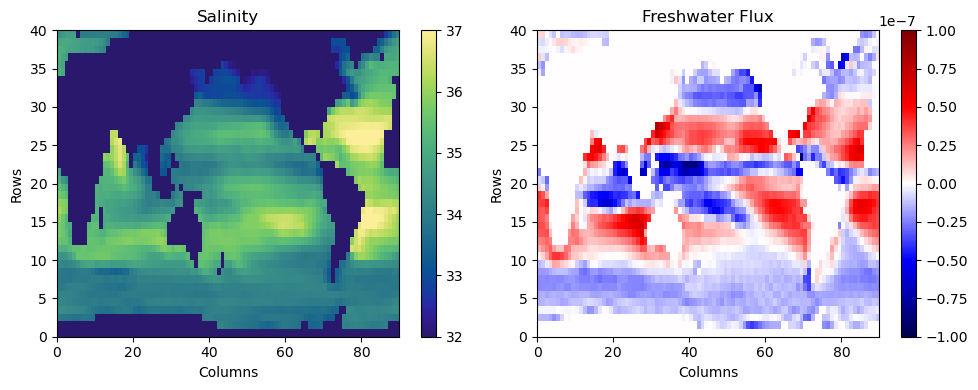

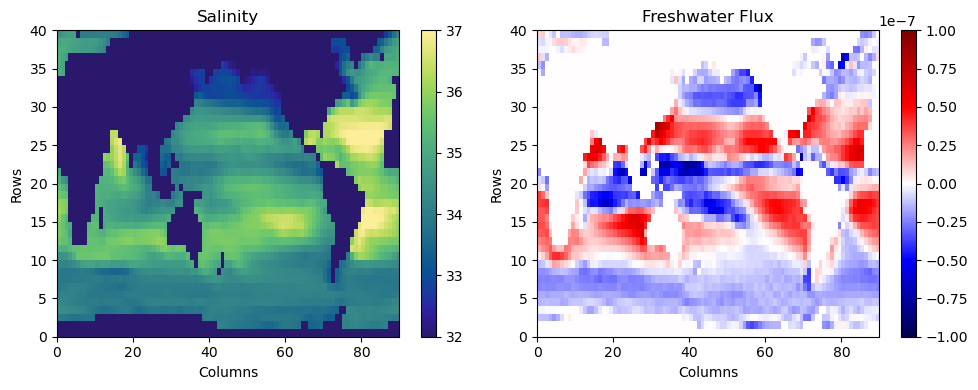

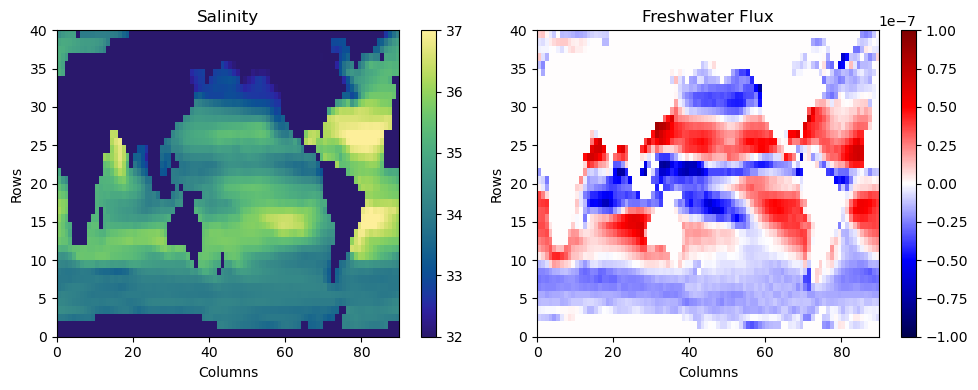

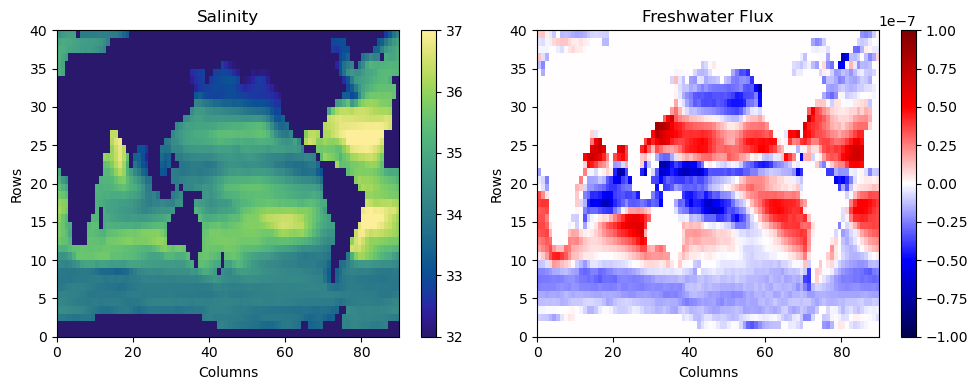

In [15]:
# make a list that will hold the paths
file_list = []

# loop through each output (10-day cadence → 365 frames over 10 years)
for day in range(1, 366):
    iteration = 5 + (day - 1) * 10
   
    data_path  = os.path.join(diags_dir, 'diagSurf',  'diagSurf.' + f'{iteration:010d}' + '.data')
   
    image_path = os.path.join(homework_folder, 'plots', 'SALT_FRESHWATER_FLUX', 'frame.' + f'{day:010d}' + '.png')

    plot_frame(data_path, image_path)

    file_list.append(image_path)


In [16]:
# set the frames per second
fps=5

# use the ImageSequenceClip module to set up the clip
clip = moviepy.video.io.ImageSequenceClip.ImageSequenceClip(file_list, fps=fps)

# write the video to a file
output_file = os.path.join(homework_folder, 'plots', 'SALT_FRESHWATERFLUX.mp4')
clip.write_videofile(output_file)

Moviepy - Building video /Users/msharkey/Documents/MLML/FALL 2025/MS 274/homework/week 5 hw/plots/SALT_FRESHWATERFLUX.mp4.
Moviepy - Writing video /Users/msharkey/Documents/MLML/FALL 2025/MS 274/homework/week 5 hw/plots/SALT_FRESHWATERFLUX.mp4



Moviepy - Done !
Moviepy - video ready /Users/msharkey/Documents/MLML/FALL 2025/MS 274/homework/week 5 hw/plots/SALT_FRESHWATERFLUX.mp4


Comment on any features you observe in your movie. Place particular focus on the potential connection(s) between your state variable and the forcing.

*Edit this markdown cell and enter your observations here*

Observing the movie, it is clear there are more frequent changes in freshwater flux than there are in ocean salinity over the 10 year period. This may indicate the freshwater flux variations are on a season cycle, whereas variations in salinity happen much more gradually. A correlation between freshwater flux and salinity is visible in the model. Salinity (state variable) is higher in regions where freshwater flux (forcing) is positive, indicating a net removal of freshwater from the ocean (evaporation exceeds precipitation/runoff). A prime example of this can be seen in the North Atlanic Ocean as well as off the coast of Brazil in the South Atlantic. These examples highlight how short-term atmospheric forcing drives surface fluxes, while the ocean integrates these signals more slowly into its state variables.

### Part 3: Plot Time Series at a Location
Based on your movie, choose an interesting place in your model domain and create a timeseries of your variables at this location. There should be two plots - either as two horizontal subplots (one for each variable), or one plot with two separate y-axes for the different variables.

Again you are using velocity and wind stress, you can either plot the magnitude of these variables or plot the vector components individually.

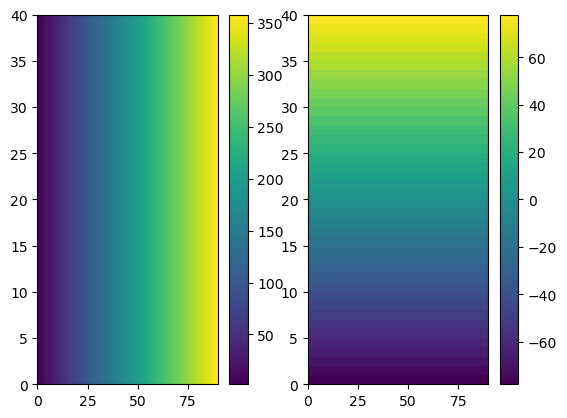

In [17]:
delX = 4
delY = 4 
xgOrigin = 0 #assuming bc nothing was given in data file
ygOrigin = -80
n_rows = 40
n_cols = 90

# recreate the grids that will be used in the model
xc = np.arange(xgOrigin+delX/2, xgOrigin+n_cols*delX, delX)
yc = np.arange(ygOrigin+delY/2, ygOrigin+n_rows*delY, delY)
XC, YC = np.meshgrid(xc, yc)

# read in the XC and YC fields
XC_file = os.path.join(homework_folder, 'XC.data')
XC_grid = np.fromfile(XC_file, '>f4').reshape((40, 90))

YC_file = os.path.join(homework_folder, 'YC.data')
YC_grid = np.fromfile(YC_file, '>f4').reshape((40, 90))

# make a side by side plot of the XC and YC fields
plt.subplot(1,2,1)
plt.pcolormesh(XC)
plt.colorbar()
plt.subplot(1,2,2)
plt.pcolormesh(YC)
plt.colorbar()
plt.show()

In [18]:
# define the lon/lat point
lon = -31
lat = 61

# find its location in the grid
dist = ((XC - lon)**2 + (YC - lat)**2)**0.5
row, col = np.where(dist==np.min(dist))

In [19]:

# make an empty array
salinity_timeseries = np.zeros((365,))
freshwater_flux_timeseries = np.zeros((365,))

# loop through all the files in the diags dir
for day in range(1, 366):

    # iteration for diagSurf files 
    iteration = 5 + (day - 1) * 10

    # identify the data file path
    data_path = os.path.join(diags_dir, 'diagSurf', 'diagSurf.' + '{:010d}'.format(iteration) + '.data')

    # read the data file (diagSurf has two 40x90 fields; take the second = salinity)
    diagSurf_grids = np.fromfile(data_path, '>f4').reshape((2, 40, 90))
    salinity_timeseries_grid = diagSurf_grids[1]

    # sample the data at the point provided and store it in the array
    salinity_timeseries[day-1] = salinity_timeseries_grid[row[0], col[0]]

    flux_file = os.path.join(diags_dir, 'diagsEXF', 'diagsEXF.' + '{:010d}'.format(iteration) + '.data')
    flux_grids = np.fromfile(flux_file, '>f4').reshape((4, 40, 90))
    freshwater_flux_grid = flux_grids[3]  # fourth field = freshwater flux
    
    freshwater_flux_timeseries[day-1] = freshwater_flux_grid[row[0], col[0]]


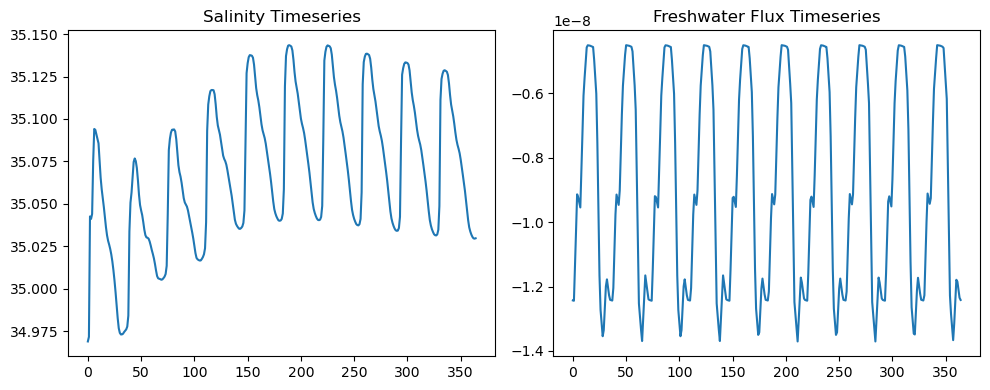

[35] [0]


In [21]:
plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.plot(salinity_timeseries)
plt.title('Salinity Timeseries')

plt.subplot(1,2,2)
plt.plot(freshwater_flux_timeseries)
plt.title('Freshwater Flux Timeseries')

plt.tight_layout()
plt.show()

print(row, col)

Comment on any features you observe in your timeseries. Place particular focus on the potential connection(s) between your state variable and the forcing. Is there anything you observe in your timeseries that you didn't catch by eye in your movie?

*Edit this markdown cell and enter your observations here*

There are a lot of oscillations in the timeseries, indicating there is variability in both datasets over the course of the model. The freshwater flux timeseries shows a strong, repeating seasonal cycle, indicated by a relatively uniform oscillation each year. The salinity variation is less uniform and has more gradual oscillations compared to the freshwater flux. Overall, positive freshwater flux (net evaporation) aligns with higher salinity, and negative flux (net freshwater input) corresponds to fresher surface waters, which is also seen in the movie. The timeseries reveals the salinity timeseries taking a slight upward trend, and then declines slightly, which is not easily observed in the movie. The timeseries offers a more detailed view of overall trends in one area, whereas the movie provides key changes on a global scale. 